In [ ]:
# Start writing code here...

In [ ]:
import sys
sys.path.append('..')

import os
import pickle
import shap

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


from lib.township_range import TownshipRanges
from lib.read_data import combine_datasets
from lib.viz import view_trs_side_by_side, chart_feature_target_relation, create_correlation_scatters, get_feature_target_correlation

from sklearn.preprocessing import scale
from sklearn.neighbors import KernelDensity
from numpy import where, random, array, quantile
from sklearn.ensemble import IsolationForest

%matplotlib inline


### Study the Anomalies in the Data : Unsupervised Learning

**[Types of Anomalies](https://machinelearningmastery.com/anomaly-detection-with-isolation-forest-and-kernel-density-estimation/)**
In data science domain, we have three different ways to classify anomalies. Understanding them correctly may have a big impact on how you handle anomalies.

- Point or Global Anomalies: Corresponding to the data points that differ significantly from the rest of the data points, global anomalies are known to be the most common form of anomalies. Usually, global anomalies are found very far away from the mean or median of any data distribution.
- Contextual or Conditional Anomalies: These anomalies have values that differ dramatically from those of the other data points in the same context. Anomalies in one dataset may not be anomalies in another.
- Collective Anomalies: The outlier objects that are tightly clustered because they have the same outlier character are referred to as collective outliers. For example, your server is not under a cyber-attack on a daily basis, therefore, it would be consider as an outlier.

A commonly used anomaly detection algorithm is Isolation Forest, so named because, it isolates a data point that can then be considered as an anomaly. It depends on the supplied threshold level to perform this isolation.

Decision trees are built using information criteria such as **Gini index or entropy**. The difference between a Random Forest Decision tree and Isolation Forest is that in the former groups are separated at the root of the tree and deeper into the branches, based on entropy or GINI index. In Isolation Forest, this decision to get to a pure leaf is based on randomly picked characteristics, and the processes randomly subsamples data in a tree structure. **Samples that reach further into the tree and require more cuts to separate them have a very little probability that they are anomalies.** Likewise, samples that are found on the shorter branches of the tree are more likely to be anomalies, since the tree found it simpler to distinguish them from the other data.

The contamination parameter which sets the percentage of points in our data to be anomalous. 

In [ ]:
dir_path = "../assets/train_test_target_shifted/"
with open(f'{dir_path}train_test_dict_target_shifted.pickle', 'rb') as file:
        train_test_dict = pickle.load( file)
X_train_impute = train_test_dict['X_train_impute']
X_test_impute = train_test_dict['X_test_impute']
y_train = train_test_dict['y_train']
y_test = train_test_dict['y_test']
y_pred = train_test_dict['y_pred']


with open(f'{dir_path}X_train_impute_target_shifted_df.pkl', 'rb') as file:
        X_train_impute_df = pickle.load( file)
with open(f'{dir_path}X_test_impute_target_shifted_df.pkl', 'rb') as file:
        X_test_impute_df = pickle.load( file)


full_df = pd.concat([X_train_impute_df, X_test_impute_df], axis=0)
#print(X_train_impute_df.shape[0], X_test_impute_df.shape[0], full_df.shape[0])

In [ ]:
full_df.sample(5)

,,TOTALDRILLDEPTH_AVG,WELLYIELD_AVG,STATICWATERLEVEL_AVG,TOPOFPERFORATEDINTERVAL_AVG,BOTTOMOFPERFORATEDINTERVAL_AVG,TOTALCOMPLETEDDEPTH_AVG,VEGETATION_NON-NATIVE_HARDWOOD_FOREST,VEGETATION_CALIFORNIA_COAST_LIVE_OAK,VEGETATION_HARD_CHAPARRAL,VEGETATION_BLUE_OAK-GRAY_PINE,...,CROP_D12,CROP_T10,CROP_T8,POPULATION_DENSITY,PCT_OF_CAPACITY,GROUNDSURFACEELEVATION_AVG,CURRENT_DEPTH,AVERAGE_YEARLY_PRECIPITATION,WELL_COUNT_AGRICULTURE,WELL_COUNT_DOMESTIC
TOWNSHIP_RANGE,YEAR,,,,,,,,,,,,,,,,,,,,,
T04N R11E,2019,-0.498229,-0.472862,-0.631480,-0.768477,-0.809372,-0.816633,0.000000,0.0,0.160667,0.199632,...,0.000000,0.000000,0.0,-0.465339,0.834922,2.461219,-1.125281,2.454246,-0.521918,-0.403081
T30S R26E,2017,-0.498229,-0.472862,-0.631480,-0.768477,-0.809372,-0.816633,0.003475,0.0,0.000000,0.000000,...,0.340336,0.025401,0.0,1.571039,-0.523743,0.178587,0.426462,-0.349911,-0.521918,-0.403081
T31S R23E,2015,-0.498229,-0.472862,-0.631480,-0.768477,-0.809372,-0.816633,0.000000,0.0,0.000000,0.000000,...,0.000000,0.000000,0.0,-0.235332,-1.317784,-0.180893,1.632266,-0.728362,-0.521918,-0.403081
T24S R22E,2017,-0.498229,-0.472862,-0.631480,-0.768477,-0.809372,-0.816633,0.000000,0.0,0.000000,0.000000,...,0.000000,0.000000,0.0,-0.526806,-1.473369,-0.410556,0.343751,-0.394627,-0.521918,-0.403081
T20S R26E,2014,-0.498229,-0.107958,0.472783,0.534419,0.769397,0.369272,0.493835,0.0,0.000000,0.000000,...,0.024796,0.000000,0.0,0.044623,-1.382175,0.211830,-0.380873,-0.887951,0.964047,0.034232


[From article](https://www.analyticsvidhya.com/blog/2021/05/getting-familiar-with-pycaret-for-anomaly-detection/)

In [ ]:

isomodel = IsolationForest(n_estimators=100, contamination=.05)
full_df['predictions'] = isomodel.fit_predict(full_df)
#np.where(full_df['predictions'] == -1)[0].shape
#There are 39 townshiprange-years considered as anomalies based on a threshold of contamination - 0.01


kern_dens = KernelDensity()
kern_dens.fit(full_df)
 
full_df['scores'] = kern_dens.score_samples(full_df)
threshold = quantile(full_df['scores'], .05)
#print(threshold)

#Make predictions similar to Isolation Forest
full_df['kd_predictions'] =  np.where( full_df['scores'] <= threshold, -1, 1) 
township_range = TownshipRanges()
spatial_df = pd.merge(township_range.sjv_township_range_df, full_df.reset_index(), how="left", on=["TOWNSHIP_RANGE", ])



X does not have valid feature names, but IsolationForest was fitted with feature names


In [ ]:
view_trs_side_by_side(
    spatial_df,
    feature="YEAR",
    value="predictions",
    title="Township-Ranges predictions by year",
    color_scheme="sjv")

alt.ConcatChart(...)

## [Kernel Density Estimator](https://machinelearningmastery.com/anomaly-detection-with-isolation-forest-and-kernel-density-estimation/)

If we consider the norm of a dataset should fit certain kind of probability distribution, the anomaly are those that we should see them rarely, or in a very low probability. Kernel density estimation is a technique that estimates the probability density function of the data points randomly in a sample space. With the density function, we can detect anomalies in a dataset.

In [ ]:
view_trs_side_by_side(
    spatial_df,
    feature="YEAR",
    value="kd_predictions",
    title="Township-Ranges predictions by year",
    color_scheme="sjv")

alt.ConcatChart(...)

### Observations from the outlier detection algorithms

- Since the Township-Ranges are 6 mile by 6 mile squares, clusters of townships that show anolmaly are more meaningful since that would show an area of similar crops, vegetation or population density. In the isolation forest anomaly detection, there is a repeating cluster of anomalous townships in the central-west of the basin for a series of years from 2014 through 2016.
- This region is also, as per the crops distribution notebook, an area where crops such as pistachios are grown

### Identify top ten townships with most anomalies 

In [ ]:
def get_top_anomalies (train_df:pd.DataFrame, test_df :pd.DataFrame, n_estimators:int=200, contamination:int=0.09, top_n:int = 10):
    """
        This function returns the top_n (default = 10) "anomalous" townships as detected using a contamination threshold 
        and n_estimators set in IsolationForest

        For each year we create a dataframe with township (sets of township ranges) which are clustered as per having an
        anomaly label assigned = -1

        param:train_df: training set
        param:test_df: test set
        param:n_estimators: number of estimators for IsolationForest
        param:contamination: Contamination parameter for IsolationForest
        param:top_n:Number of top anomalies to be returned

        Output: top_anomalies_df: Dataframe of townships wiht the number of township ranges in that township flagged as anomalies
              :anomalies_df: Dataframe of township ranges and their features which have been flagged as top anomalies
              :isomodel: IsolationForest model that detected these anomalies
              
    """
    # The background distribution fed to SHAP is the entore dataset used in unsupervised learning
    background_distribution_df = pd.concat([train_df, test_df], axis=0)

    isomodel = IsolationForest(n_estimators=n_estimators, contamination=contamination)
    #Fit the full set for background distribution
    isomodel.fit(background_distribution_df)
    background_distribution_df['predictions'] = isomodel.fit_predict(background_distribution_df)

    # #Get the dataset with anomalies as per Isolation forest
    anomalies_df = background_distribution_df[background_distribution_df['predictions'] < 0].copy()
    anomalies_df.reset_index(inplace=True)
    anomalies_df['TOWNSHIP'] = anomalies_df['TOWNSHIP_RANGE'].str.slice(stop=3)
    top_anomalies_df  = anomalies_df.groupby(['TOWNSHIP', 'YEAR']).agg(anomaly_count=('CURRENT_DEPTH', 'count'))
    # Sort and then return the top_n anomalies
    top_anomalies_df= top_anomalies_df.sort_values(by=['anomaly_count'], ascending=False).iloc[0:top_n, :]
    anomalies_df = anomalies_df.merge(top_anomalies_df, how='inner', left_on=['TOWNSHIP', 'YEAR'], right_on=['TOWNSHIP', 'YEAR']).iloc[:, :-3]
    return top_anomalies_df, anomalies_df, isomodel




In [ ]:
top_anomalies_df, anomalies_df, isomodel = get_top_anomalies (train_df = X_train_impute_df, test_df = X_test_impute_df, n_estimators=200, contamination=0.09, top_n = 10)
    

X does not have valid feature names, but IsolationForest was fitted with feature names
X does not have valid feature names, but IsolationForest was fitted with feature names


What makes for the top anomalies?

In [ ]:
anomalies_df.sample(5)

,TOWNSHIP_RANGE,YEAR,TOTALDRILLDEPTH_AVG,WELLYIELD_AVG,STATICWATERLEVEL_AVG,TOPOFPERFORATEDINTERVAL_AVG,BOTTOMOFPERFORATEDINTERVAL_AVG,TOTALCOMPLETEDDEPTH_AVG,VEGETATION_NON-NATIVE_HARDWOOD_FOREST,VEGETATION_CALIFORNIA_COAST_LIVE_OAK,...,CROP_D12,CROP_T10,CROP_T8,POPULATION_DENSITY,PCT_OF_CAPACITY,GROUNDSURFACEELEVATION_AVG,CURRENT_DEPTH,AVERAGE_YEARLY_PRECIPITATION,WELL_COUNT_AGRICULTURE,WELL_COUNT_DOMESTIC
43,T20S R22E,2015,-0.498229,2.158305,8.445067,2.774451,2.417411,2.282981,0.001165,0.000000,...,0.011983,0.0,0.0,-0.510861,-1.290980,-0.355348,0.600287,-0.772553,0.964047,-0.403081
19,T11N R17W,2016,-0.498229,-0.472862,-0.631480,-0.768477,-0.809372,-0.816633,0.010324,0.016980,...,0.000000,0.0,0.0,-0.531612,1.570422,-0.180893,2.672051,-0.127771,-0.521918,-0.403081
23,T11N R21W,2016,-0.498229,1.027534,3.035506,4.799370,3.284349,4.375557,0.317398,0.000000,...,0.085668,0.0,0.0,-0.530686,1.570422,0.864974,1.700633,-0.758129,-0.026597,-0.403081
2,T01S R04E,2016,-0.498229,-0.440664,-0.578445,-0.524184,-0.366209,-0.457778,0.000564,0.000322,...,0.020783,0.0,0.0,-0.358712,1.030959,-1.421326,-1.197589,-0.068629,-0.521918,-0.184425
29,T12S R12E,2016,3.121221,2.247169,1.217166,1.593023,2.209678,1.672927,0.014652,0.000000,...,0.036719,0.0,0.0,-0.532279,0.157864,-0.468051,-0.162692,0.146167,-0.026597,-0.403081


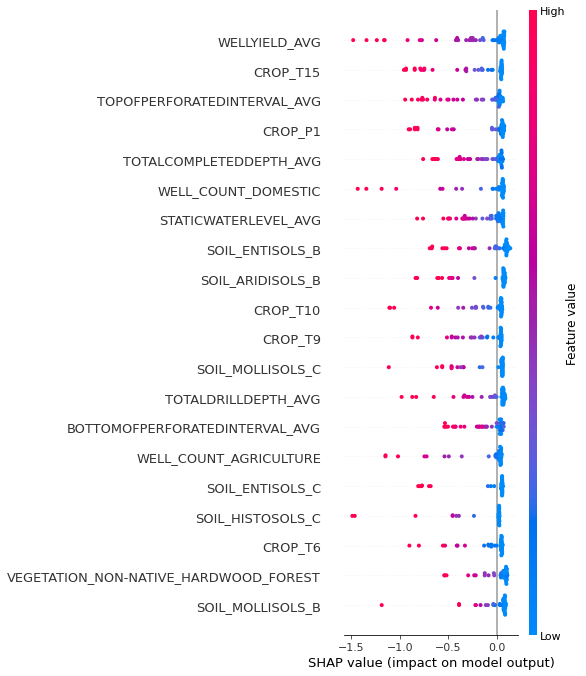

In [ ]:
# Create shap values and plot them
anomalies_df = anomalies_df.set_index(['TOWNSHIP_RANGE',  'YEAR'])
shap_values = shap.TreeExplainer(isomodel).shap_values(anomalies_df)
shap.summary_plot(shap_values, anomalies_df)

The summary plot shows the factors that dominate the features in Townships and years which are flagged anomolies by IsolationForest algorithm.

 Multi-Dimensional Scaling

MDS is a non-linear technique for embedding data in a lower-dimensional space. It maps points residing in a higher-dimensional space to a lower-dimensional space while preserving the distances between those points as much as possible.

In [ ]:
not_anomalous_df = pd.concat([full_df, anomalies_df])
not_anomalous_df = not_anomalous_df[~not_anomalous_df.index.duplicated(keep=False)]

In [ ]:
from sklearn.manifold import MDS
from matplotlib import pyplot as plt
import numpy as np
from sklearn.metrics.pairwise import manhattan_distances, euclidean_distances
from matplotlib.offsetbox import OffsetImage, AnnotationBbox


In [ ]:
colors = ['r', 'g', 'b', 'c', 'm']

def create_mds_transform(X):
    mds = MDS(random_state=42)
    X_transform = mds.fit_transform(X)
    #print(X_transform)
    return X_transform

def create_original_3d(df):
    size = [64] * df.shape[0]
    fig = plt.figure(2, (20,8))
    ax = fig.add_subplot(121, projection='3d')
    #Choose the top 3 
    plt.scatter(df['TOPOFPERFORATEDINTERVAL_AVG'], df['WELLYIELD_AVG'], zs=df['STATICWATERLEVEL_AVG'], s=size)
    plt.title('Original Points')
    ax.set_xlabel('TOPOFPERFORATEDINTERVAL_AVG')
    ax.set_ylabel('WELLYIELD_AVG')
    ax.set_zlabel('STATICWATERLEVEL_AVG')
    
def create_transform_2d(df_transform):
    size = [64] * df_transform.shape[0]
    fig = plt.figure(2, (20,8))
   
    ax = fig.add_subplot(122)
    plt.scatter(df_transform[:,0], df_transform[:,1], s=size)
    plt.title('Embedding in 2D')
    plt.xlim([-15, 15])
    plt.ylim([-15, 15])
    
    fig.subplots_adjust(wspace=.4, hspace=0.5)
    plt.show()


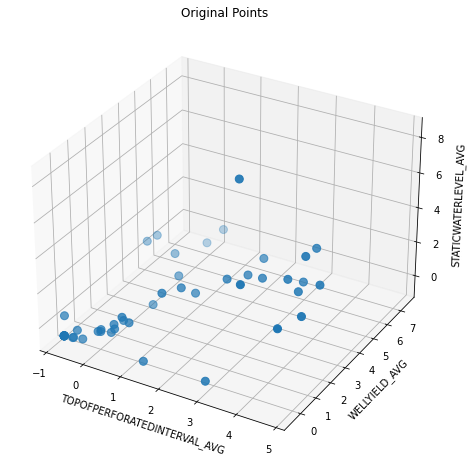

In [ ]:
create_original_3d(anomalies_df)

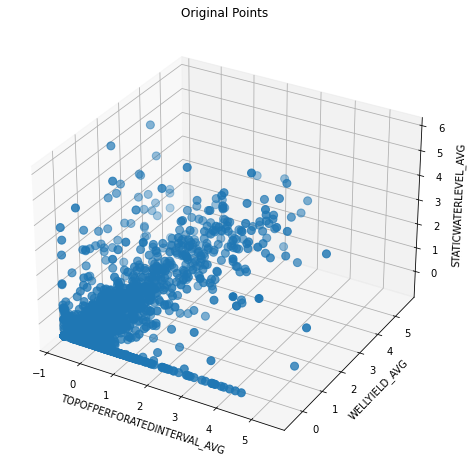

In [ ]:
create_original_3d(not_anomalous_df)

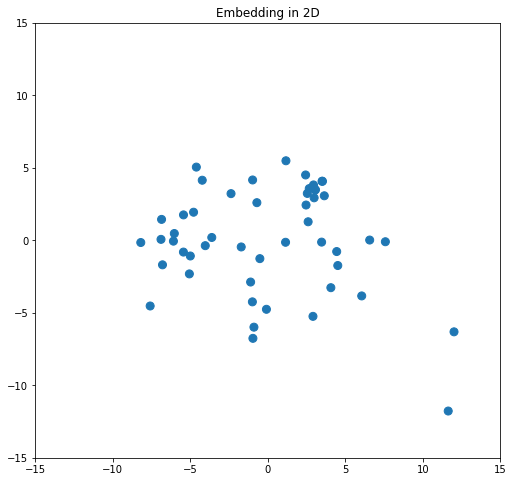

In [ ]:
X_transform_anomaly =  create_mds_transform(anomalies_df)
create_transform_2d(X_transform_anomaly)

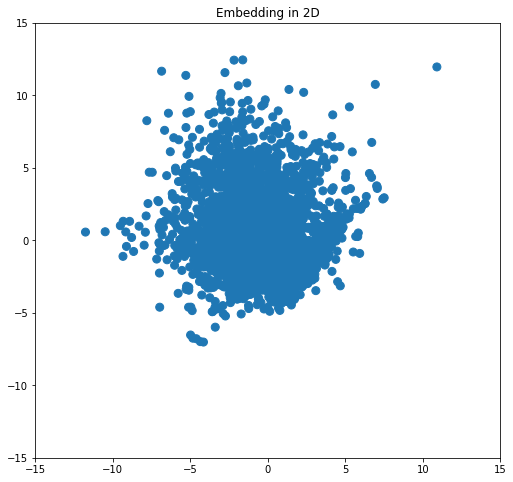

In [ ]:
X_transform_not_anomaly =  create_mds_transform(not_anomalous_df)
create_transform_2d(X_transform_not_anomaly)

> There are a couple of data point I can infer from the MDS in two dimensions as being anomolous since they lie outside the range of other data points in the 'normal', but that is not conclusive.

Noise 
DBScan algorithm has the advantage over KMeans clustering that it does not need to have the number of clusters specified before hand. It can predict noise. Works well with large datasets and that have more complex cluster shapes.

It is based on Network Graph theory. The connected component is a component in which any two vertices are connected to each other by paths. And are connected to no additional vertices in whatever the containing graph is connected. Components can be computed efficiently in time linear to the number of vertices or edges using a breadth-first or depth-first search.

Jargon
- Core samples : The definition of which points are considered core points (that form a dense region) by DBSCAN is controlled by two main parameters, called min samples and eps. Core points have at least min_samples neighbors in the eps distance.
- Boundary points are at an eps distance from core points but do not have min_samples neighbors themselves.
- Those that are not core points or Boundary points are noise.

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=b042e2da-6536-449d-95b8-d85fa08825de' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>